## **DATA CLEANING AND EDA**

**INTRODUCTION**

Welcome to my kernel on time series forecasting to predict the UK's electricity generation capacity and energy mix in 2050 (ie, the year the UK is legally bound to have reached NetZero). 

I will use the historic electricity generation data from the <a href="https://www.nationalgrideso.com/data-portal/historic-generation-mix/historic_gb_generation_mix">UK National Grid ESO.</a> 

(downloadable .csv available <a href="[Historic GB Generation Mix](https://drive.google.com/file/d/1RkhiAB5u1XZzH3hCuNIjpY5-MmQtTod9/view?usp=drive_link)">here</a>)

*Note: Data points are either MW or %.*

This is my data cleaning and EDA notebook, where I will review the dataset I've downloaded from the National Grid and begin to understand some of the historical patterns in UK electricity generation.

In [3]:
import numpy as np
import pandas as pd

import plotly.graph_objs as go
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
generation = pd.read_csv('./data/natl_grid_eso_historic_generation_2009_2024.csv')

In [5]:
#initial view of the dataframe
generation.head()

,DATETIME,GAS,COAL,NUCLEAR,WIND,HYDRO,IMPORTS,BIOMASS,OTHER,SOLAR,...,IMPORTS_perc,BIOMASS_perc,OTHER_perc,SOLAR_perc,STORAGE_perc,GENERATION_perc,LOW_CARBON_perc,ZERO_CARBON_perc,RENEWABLE_perc,FOSSIL_perc
0,2009-01-01 00:00:00+00:00,8359.0,15035.0,7098.0,274.0,246.0,2513.0,0.0,0.0,0.0,...,7.5,0.0,0.0,0.0,0.0,100.0,22.7,22.7,1.6,69.8
1,2009-01-01 00:30:00+00:00,8482.0,15094.0,7087.0,253.0,245.0,2493.0,0.0,0.0,0.0,...,7.4,0.0,0.0,0.0,0.0,100.0,22.5,22.5,1.5,70.1
2,2009-01-01 01:00:00+00:00,8444.0,15082.0,7073.0,228.0,246.0,2459.0,0.0,0.0,0.0,...,7.3,0.0,0.0,0.0,0.0,100.0,22.5,22.5,1.4,70.2
3,2009-01-01 01:30:00+00:00,8295.0,15019.0,7064.0,211.0,246.0,2426.0,0.0,0.0,0.0,...,7.3,0.0,0.0,0.0,0.0,100.0,22.6,22.6,1.4,70.1
4,2009-01-01 02:00:00+00:00,8265.0,14982.0,7051.0,195.0,246.0,2357.0,0.0,0.0,0.0,...,7.1,0.0,0.0,0.0,0.0,100.0,22.6,22.6,1.3,70.2


In [6]:
#view of the hidden columns
generation[['GENERATION', 'CARBON_INTENSITY', 'LOW_CARBON', 'ZERO_CARBON', 'RENEWABLE', 'FOSSIL']].head()

,GENERATION,CARBON_INTENSITY,LOW_CARBON,ZERO_CARBON,RENEWABLE,FOSSIL
0,33525.0,525.0,7618.0,7618.0,520.0,23394.0
1,33654.0,526.0,7585.0,7585.0,498.0,23576.0
2,33533.0,527.0,7547.0,7547.0,474.0,23527.0
3,33261.0,528.0,7521.0,7521.0,457.0,23315.0
4,33096.0,529.0,7492.0,7492.0,441.0,23247.0


### **Cleaning and feature adding**

In [7]:
#checking column datatypes and NULL values
generation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265703 entries, 0 to 265702
Data columns (total 32 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   DATETIME          265703 non-null  object 
 1   GAS               265703 non-null  float64
 2   COAL              265703 non-null  float64
 3   NUCLEAR           265703 non-null  float64
 4   WIND              265703 non-null  float64
 5   HYDRO             265703 non-null  float64
 6   IMPORTS           265703 non-null  float64
 7   BIOMASS           265703 non-null  float64
 8   OTHER             265703 non-null  float64
 9   SOLAR             265703 non-null  float64
 10  STORAGE           265703 non-null  float64
 11  GENERATION        265703 non-null  float64
 12  CARBON_INTENSITY  265703 non-null  float64
 13  LOW_CARBON        265703 non-null  float64
 14  ZERO_CARBON       265703 non-null  float64
 15  RENEWABLE         265703 non-null  float64
 16  FOSSIL            26

There does not seem to be any null values in the dataset, as the number of non-null values for each column matches the total in the range index.

DateTime is an object datatype. It makes sense to change that to a datetime datatype. Once that is done, all columns in the dataset will be numerical or datetime columns. 

In [8]:
#converting DATETIME object to datetime datatype
generation['DATETIME'] = pd.to_datetime(generation['DATETIME'])

In [9]:
#set DATETIME column as the index for the dataframe, keep the DATETIME column as a regular column
generation = generation.set_index("DATETIME")

In [10]:
#confirm datatype change for DATETIME column
generation.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265703 entries, 2009-01-01 00:00:00+00:00 to 2024-02-27 11:00:00+00:00
Data columns (total 31 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   GAS               265703 non-null  float64
 1   COAL              265703 non-null  float64
 2   NUCLEAR           265703 non-null  float64
 3   WIND              265703 non-null  float64
 4   HYDRO             265703 non-null  float64
 5   IMPORTS           265703 non-null  float64
 6   BIOMASS           265703 non-null  float64
 7   OTHER             265703 non-null  float64
 8   SOLAR             265703 non-null  float64
 9   STORAGE           265703 non-null  float64
 10  GENERATION        265703 non-null  float64
 11  CARBON_INTENSITY  265703 non-null  float64
 12  LOW_CARBON        265703 non-null  float64
 13  ZERO_CARBON       265703 non-null  float64
 14  RENEWABLE         265703 non-null  float64
 15  FOSSIL            2657

The historic demand data starts at 00:00:00 (ie, 12:00am/midnight) on 01 Jan 2009 and ends at 11:00am on 27 Feb 2024. 

In [11]:
#checking for duplicates
generation[generation.duplicated(keep=False)]
##passing keep=False parameter to see all duplicates since default keep=True makes 1st duplicate occurence False

,GAS,COAL,NUCLEAR,WIND,HYDRO,IMPORTS,BIOMASS,OTHER,SOLAR,STORAGE,...,IMPORTS_perc,BIOMASS_perc,OTHER_perc,SOLAR_perc,STORAGE_perc,GENERATION_perc,LOW_CARBON_perc,ZERO_CARBON_perc,RENEWABLE_perc,FOSSIL_perc
DATETIME,,,,,,,,,,,,,,,,,,,,,
2009-03-28 04:00:00+00:00,12892.0,9823.0,9036.0,1019.0,651.0,1084.0,0.0,0.0,0.0,0.0,...,3.1,0.0,0.0,0.0,0.0,100.0,31.0,31.0,4.8,65.8
2009-03-28 04:30:00+00:00,12892.0,9823.0,9036.0,1019.0,651.0,1084.0,0.0,0.0,0.0,0.0,...,3.1,0.0,0.0,0.0,0.0,100.0,31.0,31.0,4.8,65.8
2009-11-12 09:30:00+00:00,20826.0,16635.0,7331.0,452.0,534.0,0.0,0.0,0.0,0.0,340.0,...,0.0,0.0,0.0,0.0,0.7,100.0,18.0,18.0,2.1,81.2
2009-11-12 10:00:00+00:00,20826.0,16635.0,7331.0,452.0,534.0,0.0,0.0,0.0,0.0,340.0,...,0.0,0.0,0.0,0.0,0.7,100.0,18.0,18.0,2.1,81.2
2009-11-12 10:30:00+00:00,20826.0,16635.0,7331.0,452.0,534.0,0.0,0.0,0.0,0.0,340.0,...,0.0,0.0,0.0,0.0,0.7,100.0,18.0,18.0,2.1,81.2
2009-11-12 11:00:00+00:00,20826.0,16635.0,7331.0,452.0,534.0,0.0,0.0,0.0,0.0,340.0,...,0.0,0.0,0.0,0.0,0.7,100.0,18.0,18.0,2.1,81.2
2009-11-12 11:30:00+00:00,20826.0,16635.0,7331.0,452.0,534.0,0.0,0.0,0.0,0.0,340.0,...,0.0,0.0,0.0,0.0,0.7,100.0,18.0,18.0,2.1,81.2
2010-10-19 08:30:00+00:00,18292.0,15082.0,8276.0,618.0,232.0,0.0,0.0,0.0,0.0,594.0,...,0.0,0.0,0.0,0.0,1.4,100.0,21.2,21.2,2.0,77.4
2010-10-19 09:00:00+00:00,18292.0,15082.0,8276.0,618.0,232.0,0.0,0.0,0.0,0.0,594.0,...,0.0,0.0,0.0,0.0,1.4,100.0,21.2,21.2,2.0,77.4


There are 11 rows with duplicate values. That is a very small number of rows when compared to the total number of rows in the dataset. In theory, it makes sense to drop them. However, when looking at the DateTime column, there are different timestamps. It's likely that the demand from the previous half hour did not change, and therefore the generation required didn't change. As such, we should keep all the rows.

To help with time series modelling, we will also create separate Year, Month, Week, and Day columns for generation.

In [12]:
# Resetting the index to avoid non-unique index values
generation_reset_index = generation.reset_index()

#extracting Year, Month, Week, and Day data as new columns
generation_reset_index['generation_YEAR'] = generation_reset_index['DATETIME'].dt.year
generation_reset_index['generation_MONTH'] = generation_reset_index['DATETIME'].dt.month
generation_reset_index['generation_WEEK'] = generation_reset_index['DATETIME'].dt.isocalendar().week
generation_reset_index['generation_DAY'] = generation_reset_index['DATETIME'].dt.day

generation = generation_reset_index.set_index('DATETIME')

In [13]:
#checking the new columns were added onto the end of the dataframe
generation.sample(10)

,GAS,COAL,NUCLEAR,WIND,HYDRO,IMPORTS,BIOMASS,OTHER,SOLAR,STORAGE,...,STORAGE_perc,GENERATION_perc,LOW_CARBON_perc,ZERO_CARBON_perc,RENEWABLE_perc,FOSSIL_perc,generation_YEAR,generation_MONTH,generation_WEEK,generation_DAY
DATETIME,,,,,,,,,,,,,,,,,,,,,
2018-12-23 04:30:00+00:00,11195.0,1039.0,6686.0,2499.0,419.0,2686.0,1605.0,64.0,0.0,0.0,...,0.0,100.0,42.8,36.7,11.1,46.7,2018,12,51,23
2019-02-14 09:00:00+00:00,16781.0,2001.0,6485.0,6383.0,907.0,4108.0,2831.0,69.0,2634.0,710.0,...,1.7,100.0,44.8,38.2,23.1,43.8,2019,2,7,14
2015-02-14 00:00:00+00:00,3100.0,13222.0,8494.0,3100.0,423.0,2988.0,0.0,1121.0,0.0,0.0,...,0.0,100.0,37.0,37.0,10.9,50.3,2015,2,7,14
2020-06-05 05:00:00+00:00,4639.0,0.0,4729.0,9253.0,168.0,1645.0,2908.0,106.0,689.0,0.0,...,0.0,100.0,73.5,61.5,41.9,19.2,2020,6,23,5
2009-12-28 16:00:00+00:00,20473.0,15848.0,7889.0,46.0,349.0,80.0,0.0,0.0,0.0,1040.0,...,2.3,100.0,18.1,18.1,0.9,79.4,2009,12,53,28
2012-06-15 16:30:00+00:00,10852.0,14909.0,7849.0,3352.0,173.0,1940.0,0.0,44.0,0.0,400.0,...,1.0,100.0,28.8,28.8,8.9,65.2,2012,6,24,15
2017-05-31 07:00:00+00:00,14298.0,546.0,8412.0,956.0,131.0,1914.0,0.0,1990.0,2021.0,362.0,...,1.2,100.0,37.6,37.6,10.1,48.5,2017,5,22,31
2011-06-03 20:30:00+00:00,15098.0,6896.0,8753.0,1015.0,359.0,930.0,0.0,0.0,0.0,356.0,...,1.1,100.0,30.3,30.3,4.1,65.8,2011,6,22,3
2009-06-15 07:30:00+00:00,16430.0,13445.0,8183.0,54.0,146.0,0.0,0.0,0.0,0.0,646.0,...,1.7,100.0,21.5,21.5,0.5,76.8,2009,6,25,15


Now we save a cleaned version of of the dataset.

In [14]:
generation_clean = generation.to_csv('./data/natl_grid_eso_generation_2009_to_2024feb_clean.csv')



In [15]:
generation_clean = pd.read_csv('./data/natl_grid_eso_generation_2009_to_2024feb_clean.csv')

In [16]:
generation_clean.head()

,DATETIME,GAS,COAL,NUCLEAR,WIND,HYDRO,IMPORTS,BIOMASS,OTHER,SOLAR,...,STORAGE_perc,GENERATION_perc,LOW_CARBON_perc,ZERO_CARBON_perc,RENEWABLE_perc,FOSSIL_perc,generation_YEAR,generation_MONTH,generation_WEEK,generation_DAY
0,2009-01-01 00:00:00+00:00,8359.0,15035.0,7098.0,274.0,246.0,2513.0,0.0,0.0,0.0,...,0.0,100.0,22.7,22.7,1.6,69.8,2009,1,1,1
1,2009-01-01 00:30:00+00:00,8482.0,15094.0,7087.0,253.0,245.0,2493.0,0.0,0.0,0.0,...,0.0,100.0,22.5,22.5,1.5,70.1,2009,1,1,1
2,2009-01-01 01:00:00+00:00,8444.0,15082.0,7073.0,228.0,246.0,2459.0,0.0,0.0,0.0,...,0.0,100.0,22.5,22.5,1.4,70.2,2009,1,1,1
3,2009-01-01 01:30:00+00:00,8295.0,15019.0,7064.0,211.0,246.0,2426.0,0.0,0.0,0.0,...,0.0,100.0,22.6,22.6,1.4,70.1,2009,1,1,1
4,2009-01-01 02:00:00+00:00,8265.0,14982.0,7051.0,195.0,246.0,2357.0,0.0,0.0,0.0,...,0.0,100.0,22.6,22.6,1.3,70.2,2009,1,1,1


In [17]:
generation_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265703 entries, 0 to 265702
Data columns (total 36 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   DATETIME          265703 non-null  object 
 1   GAS               265703 non-null  float64
 2   COAL              265703 non-null  float64
 3   NUCLEAR           265703 non-null  float64
 4   WIND              265703 non-null  float64
 5   HYDRO             265703 non-null  float64
 6   IMPORTS           265703 non-null  float64
 7   BIOMASS           265703 non-null  float64
 8   OTHER             265703 non-null  float64
 9   SOLAR             265703 non-null  float64
 10  STORAGE           265703 non-null  float64
 11  GENERATION        265703 non-null  float64
 12  CARBON_INTENSITY  265703 non-null  float64
 13  LOW_CARBON        265703 non-null  float64
 14  ZERO_CARBON       265703 non-null  float64
 15  RENEWABLE         265703 non-null  float64
 16  FOSSIL            26

Hmmm.......there are the correct number of rows (ie, excluding the duplicated rows that were removed), but the DATETIME column is an object datatype again in the clean .csv file. Let's convert it to datetime datatype again.

In [18]:
#converting DATETIME object to datetime datatype
generation_clean['DATETIME'] = pd.to_datetime(generation_clean['DATETIME'])

In [19]:
#set DATETIME column as the index for the dataframe, keep the DATETIME column as a regular column
generation_clean = generation_clean.set_index("DATETIME")

In [20]:
generation_clean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265703 entries, 2009-01-01 00:00:00+00:00 to 2024-02-27 11:00:00+00:00
Data columns (total 35 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   GAS               265703 non-null  float64
 1   COAL              265703 non-null  float64
 2   NUCLEAR           265703 non-null  float64
 3   WIND              265703 non-null  float64
 4   HYDRO             265703 non-null  float64
 5   IMPORTS           265703 non-null  float64
 6   BIOMASS           265703 non-null  float64
 7   OTHER             265703 non-null  float64
 8   SOLAR             265703 non-null  float64
 9   STORAGE           265703 non-null  float64
 10  GENERATION        265703 non-null  float64
 11  CARBON_INTENSITY  265703 non-null  float64
 12  LOW_CARBON        265703 non-null  float64
 13  ZERO_CARBON       265703 non-null  float64
 14  RENEWABLE         265703 non-null  float64
 15  FOSSIL            2657

____

### **EDA - Exploratory Data Analysis** 

#### ***Univariate Analysis***

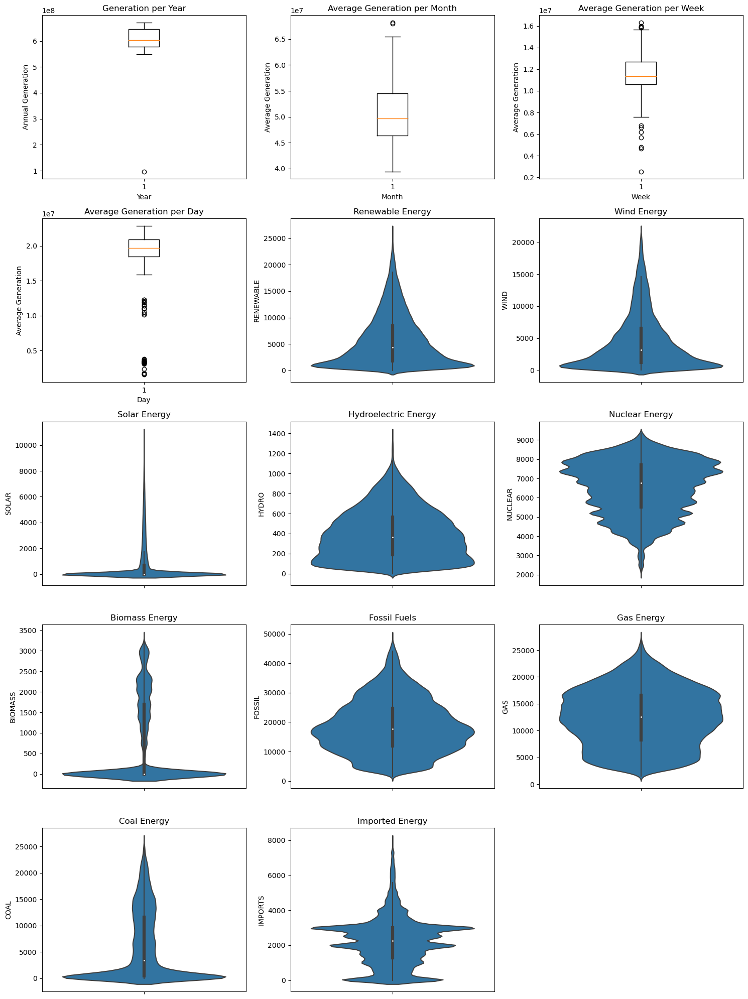

In [21]:
fig, axs = plt.subplots(5, 3, figsize=(15, 20))

#assigning variable for total energy generation per year
total_generation_year = generation_clean.groupby('generation_YEAR')['GENERATION'].sum()

#assigning variables for calculating average energy generation per month, week, and day
average_generation_month = generation_clean.groupby(['generation_MONTH','generation_YEAR'])['GENERATION'].sum()
average_generation_week = generation_clean.groupby(['generation_WEEK','generation_YEAR'])['GENERATION'].sum()
average_generation_day = generation_clean.groupby(['generation_DAY','generation_YEAR'])['GENERATION'].sum()

#total generation by year
axs[0, 0].boxplot(total_generation_year)
axs[0, 0].set_title('Generation per Year')
axs[0, 0].set_xlabel('Year')
axs[0, 0].set_ylabel('Annual Generation')

#average generation by month
axs[0, 1].boxplot(average_generation_month)
axs[0, 1].set_title('Average Generation per Month')
axs[0, 1].set_xlabel('Month')
axs[0, 1].set_ylabel('Average Generation')

#average generation by week
axs[0, 2].boxplot(average_generation_week)
axs[0, 2].set_title('Average Generation per Week')
axs[0, 2].set_xlabel('Week')
axs[0, 2].set_ylabel('Average Generation')

#average generation by day
axs[1, 0].boxplot(average_generation_day)
axs[1, 0].set_title('Average Generation per Day')
axs[1, 0].set_xlabel('Day')
axs[1, 0].set_ylabel('Average Generation')

#using violin plots to understand frequency of higher power generation across energy sources

#generation: renewables
sns.violinplot(data=generation, y='RENEWABLE', ax=axs[1, 1])
axs[1, 1].set_title('Renewable Energy')

#generation: wind
sns.violinplot(data=generation, y='WIND', ax=axs[1, 2])
axs[1, 2].set_title('Wind Energy')

#generation: solar
sns.violinplot(data=generation, y='SOLAR', ax=axs[2, 0])
axs[2, 0].set_title('Solar Energy')

#generation: hydro
sns.violinplot(data=generation, y='HYDRO', ax=axs[2, 1])
axs[2, 1].set_title('Hydroelectric Energy')

#generation: nuclear
sns.violinplot(data=generation, y='NUCLEAR', ax=axs[2, 2])
axs[2, 2].set_title('Nuclear Energy')

#generation: biomass
sns.violinplot(data=generation, y='BIOMASS', ax=axs[3, 0])
axs[3, 0].set_title('Biomass Energy')

#generation: fossil fuels
sns.violinplot(data=generation, y='FOSSIL', ax=axs[3, 1])
axs[3, 1].set_title('Fossil Fuels')

#generation: gas
sns.violinplot(data=generation, y='GAS', ax=axs[3, 2])
axs[3, 2].set_title('Gas Energy')

#generation: coal
sns.violinplot(data=generation, y='COAL', ax=axs[4,0])
axs[4,0].set_title('Coal Energy')

#generation: imports
sns.violinplot(data=generation, y='IMPORTS', ax=axs[4,1])
axs[4,1].set_title('Imported Energy')

# Hide empty subplot in the 5th row and 3rd column
axs[4, 2].set_visible(False)

plt.tight_layout()
plt.show()

The boxplot for generation by year shows an average of 6 x 1e8 (600 million) megawatts(MW) electricity generation per year. 

The boxplot for average generation by month shows an average of just below 5 x 1e7 (50 million) megawatts (MW) electricity generation per month. 

The boxplot for average generation by week shows an average of around 1.1 x 1e7 (10 million) megawatts (MW) electricity generation per week. There are several outliers on both ends of the boxplot.

The boxplot for average generation by day shows an average of just below x 2e7 (20 million) megawatts (MW) electricity generation per day. This is, surprisingly, well above the average weekly generation. Further exploration is needed as there are several outliers inboth boxplots, which indicates the averages calculations may be skewed.

The violin plot for Renewable energy shows the highest frequency of energy generation occurred below the 2500-3000 range. Since the violin plot for Wind very closely matches the Renewable energy violin plot, it indicates that Renewable energy generation is likely dominated by Wind.

The violine plot for Fossil fuels seems to be influenced by both Gas and Coal, as its shape indicates the highest frequency around the 17000-18000 range, whereas the Gas violin plot shows highest frequency around the 12000 to 17000 range and the Coal plot shows highest freqency around the 1000 range. 

It seems, from the violin plot for Imported energy, that the UK's needs for imported energy vary, anywhere from zero to around 3000.

#### ***Bivariate Analysis***

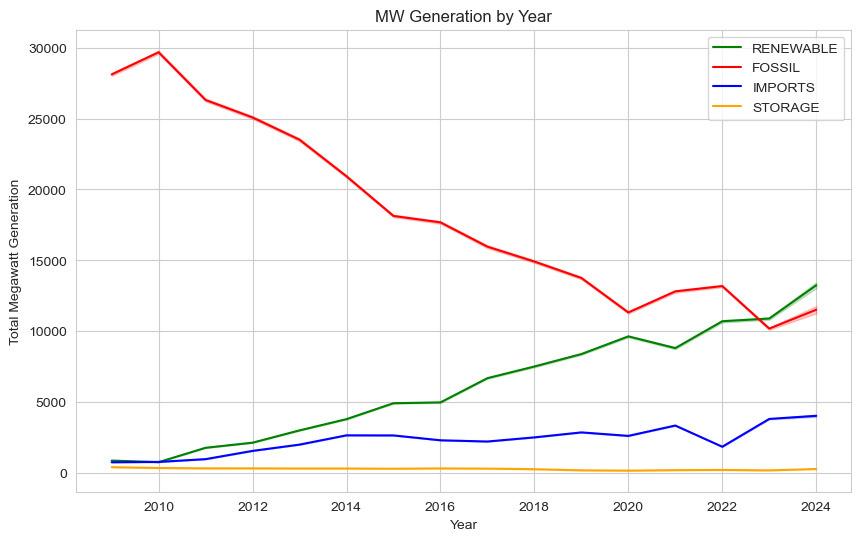

In [22]:
# assign a variable to the various energy sources
energy_sources = generation_clean[["RENEWABLE", "FOSSIL", "IMPORTS", "STORAGE"]]

# Set the style
sns.set_style("whitegrid")

# set the colour palette
colors = {'RENEWABLE': 'green', 'FOSSIL': 'red', 'IMPORTS': 'blue', 'STORAGE': 'orange'}

plt.figure(figsize=(10, 6))
for source in energy_sources:
    sns.lineplot(x=generation['generation_YEAR'], y=generation[source], label=source, color=colors[source])

plt.xlabel('Year')
plt.ylabel('Total Megawatt Generation')
plt.title('MW Generation by Year')
plt.legend()
plt.grid(True)
plt.show()

The graph shows that there has been a steady decline in the UK's use of fossil fuels in electricity generation from 2010 (when it was almost 100%) to 2023, when it fell below the use of renewable energy sources for the first time.

There has been a slower rise in Imports of electricity, indicating there is potential to continue growing that source of electricity generation. This is backed by an <a href="https://www.ofgem.gov.uk/publications/ofgem-gives-provisional-green-light-projects-power-millions-homes">Ofgem press release from March 2024</a> highlighting the potential of growing Imports capacity, as the energy regulator has recommended approval for projects that would increase the UK's Imports capacity by 27%.

There has been no change in Storage, as it has remained at near zero across the entire timeline of the dataset. According to <a href="https://www.theaic.co.uk/aic/news/industry-news/james-carthew-blame-imbalanced-national-grid-for-battery-funds-woes">CityWire</a>, this may be more indicative of the National Grid's ability to use battery storage, rather than total existing storage capacity. 

Although the National Grid has stated the flexibility provided by battery storage capacity may be an <a href="https://www.nationalgrideso.com/document/273166/download">essential milestone</a> in achieving Net Zero, the system's capabilities had historically <a href="https://modoenergy.com/research/7190">limited access</a> to stored energy and the role it could play in the grid's Balancing Mechanism. 

Further desktop research has shown that, in <a href="https://www.nationalgrid.com/national-grid-accelerate-20gw-grid-connections-across-its-transmission-and-distribution-networks">November 2023</a>, the National Grid announced the fast-tracking of 10GW of battery energy storage projects to the grid. Additionally, in March 2024, the National Grid <a href="https://www.nationalgrideso.com/document/300231/download">doubled its battery transmission time</a> from 15 minutes to 30 minutes, allowing for a <a href="https://www.current-news.co.uk/30-minute-rule-battery-dispatch-duration/">47% increase</a> in its weekly battery storage dispatched volume. These combined efforts may mean battery storage will play a much larger role in the UK's path to net zero than is currently reflected in historical data. Given a forecasting model's limitation in accounting for such recent events since the dataset dates only to February 2024, adjustments may need to be made manually after initial modelling.

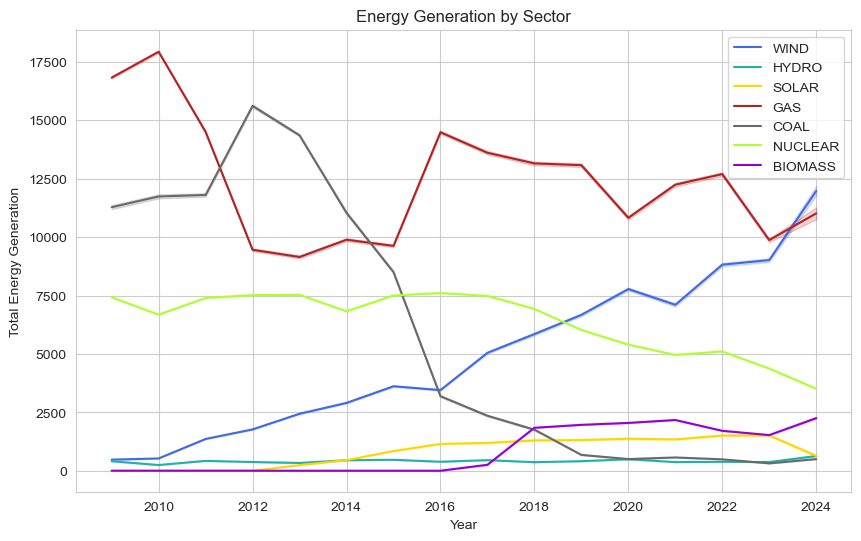

In [23]:
# assign a variable to the various energy sources
energy_sources = generation_clean[["WIND", "HYDRO", "SOLAR", "GAS", "COAL", "NUCLEAR", "BIOMASS"]]

# Set the style
sns.set_style("whitegrid")

# set the colour palette
colors = {'WIND': 'royalblue', 'HYDRO': 'lightseagreen', 'SOLAR': 'gold', 'GAS': 'firebrick', 'COAL': 'dimgray', 'NUCLEAR': 'greenyellow', 'BIOMASS': 'darkviolet'}

plt.figure(figsize=(10, 6))
for source in energy_sources:
    sns.lineplot(x=generation['generation_YEAR'], y=generation[source], label=source, color=colors[source])

plt.xlabel('Year')
plt.ylabel('Total Energy Generation')
plt.title('Energy Generation by Sector')
plt.legend()
plt.grid(True)
plt.show()

As suspected from the violin plots, Renewable energy generation is dominated by Wind. Wind has grown rapidly from 2010 to 2024, and seems to have accounted for much of the UK's increase in renewable energy generation capacity. 

The sharp decline in the use of Coal for energy generation from 2012 to 2016 reflects the drop in fossil fuel use seen in the MW Generation by Year plot above. Part of that decline is accounted for by an increase in Biomass energy generation capacity in 2017, <a href="chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://assets.publishing.service.gov.uk/media/5ca1e39c40f0b625e1cbd862/Press_Notice_March_2019.pdf">driven by conversions from coal to biomass at the Drax and Lynemouth power stations</a>. However, total Biomass energy generation seems to have remained relatively even since then. 

The decline in coal seems to have accounted for most of the UK's transition away from fossil fuels. As evident in the plot, the UK's use of gas increased sharply in 2016 to <a href="https://www.carbonbrief.org/analysis-uk-wind-generated-more-electricity-coal-2016/">balance the decline in use of coal</a> while generation capacity from renewables was still insufficient to cover the gap.

Although Wind energy generation has recently outstripped Gas, Gas energy generation levels today are still above where they were in 2013, 10 years ago. The capacity growth in Hydro and Solar have been slower than Wind, indicating a potential limitation in their contribution to UK's continued transition away from fossil fuels. It is unclear Nuclear energy's contribution to the UK's future renewable energy mix, as generation declined from 2017 to 2024. Moreover, the UK currently only has one nuclear power plant under construction <a href="https://news.sky.com/story/government-unveils-roadmap-for-several-new-nuclear-power-plants-13045516">(Hinkley Point C)</a>, which is several years behind schedule and running costs almost double the initially approved budget of £18 billion.

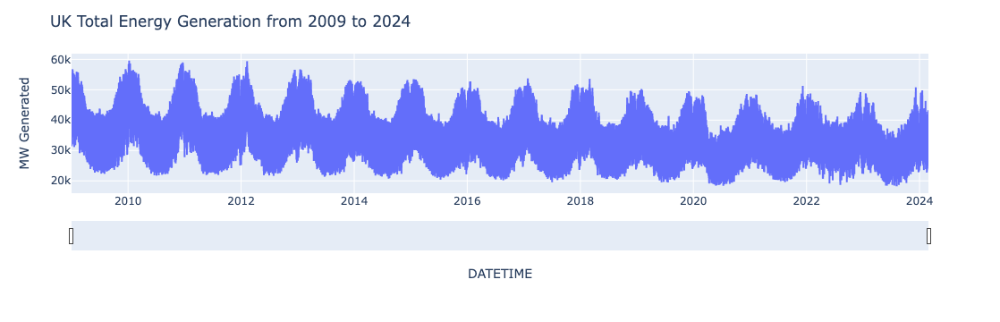

In [24]:
# add lines for each column
fig = px.line(generation_clean, x=generation_clean.index, y='GENERATION')

# axis labels and title
fig.update_layout(
    yaxis_title="MW Generated", 
    legend_title="", 
    title="UK Total Energy Generation from 2009 to 2024"
)

# activate slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

This graph shows that there are consistent peaks and troughs from 2009 to 2024 in the UK's electricity generation. However, the annual peaks have slowly dropped over time. In January 2010, the UK generated 55k GW; whereas on 18 Jan 2024, the UK generated 49.8K GW of energy. (On the same day in 2023, the UK generated 48.8k GW, and 47.5k GW on the same day in 2022.)

According to the <a href="chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://assets.publishing.service.gov.uk/media/651422e03d371800146d0c9e/Energy_Consumption_in_the_UK_2023.pdf">UK Department for Energy Security & Net Zero</a>, domestic energy consumption dropped by 14% in 2022. The main sources of the behaviour change in consumers were record warm temperatures (potentially a side effect of climate change/global warming) and increased energy prices (an almost 100% price increase over the course of 2022). Recent economic stagnation and the advent of more efficient electrical appliances (eg, LED light bulbs and energy efficient washing machines) could also be contributing factors. However, it is difficult to tell whether this downward trend will continue, as the demand for energy will increase over time, given the <a href="https://www.ons.gov.uk/peoplepopulationandcommunity/populationandmigration/populationprojections/bulletins/nationalpopulationprojections/2021basedinterim">Office of National Statistics'</a> predicted 11% growth in national population by 2050. 

#### ***NEXT STEPS***

**Further EDA is required to explore the following:**

- The outliers in the Generation by Week and Generation by Day boxplots. These may resolve themselves in further bivariate analysis.

- seasonality trends

- preliminary forecasting: initial modelling

- adjustments and further forecasting: refinement of the model to account for inflation and population growth


#### **SUMMARY**

**In summary:**

- The generation dataset shows half-hourly updates on electricity generation from 01 Jan 2009 to 27 Feb 2024.

- The generation dataset was quite clean, with no NULL values and only 8 rows of duplicate values. The only non-numerical column was the DATETIME column, which was changed to a datetime datatype.

- To make time series forecasting easier, Generation by Year, Month, Week, and Day columns were added.

- Wind energy composes the largest portion of renewable energy generation. Similarly, Gas is the largest portion of fossil fuel energy generation. This is contrasted by the sharp decline in Coal energy generation during the UK's transition away from an almost 100% reliance on fossil fuels in 2009.

- Battery storage is likely a vital component of the UK's path to net zero. However, the National Grid's recent efforts to fast-track growth of battery storage capacity while resolving the system's ability to use stored energy in its Balancing Mechanism are not reflected in historical data, and manual adjustments may need to be made post-initial modelling. 

- Total energy generation has shown a downward trend from 2009 to 2024. This is a mixed reflection of the UK's move away from fossil fuels against the steady growth of energy generation from renewable sources. There is also the added complexity of geopolitical effects on energy price volatility/rising cost of living resulting in dampening overall energy use. This will need to be balanced in the model forecasting against the UK's projected 11% growth in national population by and the subsequent increase in energy demand.

- Immediate next steps include advanced EDA, with preliminary modelling/forecasting to follow.